<a href="https://colab.research.google.com/github/ameyshinde28/Image_Background_Remover/blob/main/background_image_remover.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
def remove_background(image, x, y):
  pass

In [ ]:
# Installing requirements
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install torch torchvision opencv-python numpy

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-7vgzhy7y
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-7vgzhy7y
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 526fd066dea338ba2ca08886853bd37ffd6a8aec
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36590 sha256=bc8e86452aad15a4ec776efe45b8dcd8b337d0da90218942568f4f40c703da7a
  Stored in directory: /tmp/pip-ephem-wheel-cache-5zf3910t/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment_anything


In [ ]:
# Creating a SAM predictor
import os

from segment_anything import SamPredictor, sam_model_registry

model_path = './sam_vit_b_01ec64.pth'

if not os.path.exists(model_path):
  !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

sam = sam_model_registry["vit_b"](checkpoint=model_path)
predictor = SamPredictor(sam)
predictor

In [ ]:
# load image and select x, y coordinates to test
import cv2

image_path = './0_3.png'
if not os.path.exists(image_path):
  !wget https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png

x = 512
y = 690

image = cv2.imread(image_path)

--2024-09-12 12:28:59--  https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png
Resolving cdn.midjourney.com (cdn.midjourney.com)... 104.18.33.217, 172.64.154.39, 2606:4700:4400::6812:21d9, ...
Connecting to cdn.midjourney.com (cdn.midjourney.com)|104.18.33.217|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1785134 (1.7M) [image/png]
Saving to: ‘0_3.png’

0_3.png             100%[===================>]   1.70M  3.83MB/s    in 0.4s    

2024-09-12 12:29:01 (3.83 MB/s) - ‘0_3.png’ saved [1785134/1785134]



In [ ]:
# Using SAM predictor on (image, x, y) to gett location of subject
import numpy as np

predictor.set_image(image)

masks, scores, logits = predictor.predict(
    point_coords=np.asarray([[x, y]]),
    point_labels=np.asarray([1]),
    multimask_output=True
)

C, H, W = masks.shape
result_mask = np.zeros((H, W), dtype=bool)

for j in range(C):
  result_mask = masks[j, :, :]

result_mask = result_mask.astype(np.uint8)

In [ ]:
# remove background
alpha_channel = np.ones(result_mask.shape, dtype=result_mask.dtype) * 255
alpha_channel[result_mask == 0] = 0

result_image = cv2.merge((image, alpha_channel))


In [ ]:
# wrap it up as a function

import base64
import os

from segment_anything import SamPredictor, sam_model_registry
import cv2
import numpy as np

model_path = './sam_vit_b_01ec64.pth'

if not os.path.exists(model_path):
  !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

sam = sam_model_registry["vit_b"](checkpoint=model_path)
predictor = SamPredictor(sam)

def remove_background(image_base64_encoding, x, y):
  image_bytes = base64.b64decode(image_base64_encoding)

  image = cv2.imdecode(np.frombuffer(image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)

  predictor.set_image(image)

  masks, scores, logits = predictor.predict(
      point_coords=np.asarray([[x, y]]),
      point_labels=np.asarray([1]),
      multimask_output=True
  )

  C, H, W = masks.shape

  result_mask = np.zeros((H, W), dtype=bool)

  for j in range(C):
    result_mask |= masks[j, :, :]

  result_mask = result_mask.astype(np.uint8)

  alpha_channel = np.ones(result_mask.shape, dtype=result_mask.dtype) * 255
  alpha_channel[result_mask == 0] = 0

  result_image = cv2.merge((image, alpha_channel))

  _, result_image_bytes = cv2.imencode('.png', result_image)

  result_image_bytes = result_image_bytes.tobytes()

  result_image_bytes_encoded_base64 = base64.b64encode(result_image_bytes).decode('utf-8')

  return result_image_bytes_encoded_base64

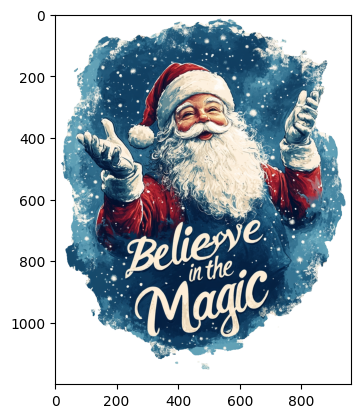

In [ ]:
import cv2
import matplotlib.pyplot as plt

# load image and select x, y coordinates to test


image_path = './0_3.png'
if not os.path.exists(image_path):
  !wget https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png

x = 512
y = 690

image = cv2.imread(image_path)

_, image_bytes = cv2.imencode('.png', image)

image_bytes = image_bytes.tobytes()

image_bytes_encoded_base64 = base64.b64encode(image_bytes).decode('utf-8')

result_image = remove_background(image_bytes_encoded_base64, x, y)

result_image_bytes = base64.b64decode(result_image)

result_image =cv2.imdecode(np.frombuffer(result_image_bytes, dtype=np.uint8), cv2.IMREAD_UNCHANGED)

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGRA2RGBA))
plt.show()

In [ ]:
filename = 'savedImage.png'

cv2.imwrite(filename, result_image)

True

In [ ]:
!pip install modelbit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.4/147.4 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 65.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 55.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 kB 6.0 MB/s eta 0:00:00
  Attempting uninstall: build
    Found existing installation: build 1.2.2
    Uninstalling build-1.2.2:
      Successfully uninstalled build-1.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pip-tools 7.4.1 requires build>=1.0.0, but you have build 0.10.0 which is incompatible.


In [ ]:
import modelbit

mb = modelbit.login()

In [ ]:
mb.deploy(remove_background)

Encrypting 'predictor': 100%|██████████| 362M/362M [00:03<00:00, 123MB/s]
Uploading 'predictor': 100%|██████████| 335M/335M [00:05<00:00, 65.5MB/s]


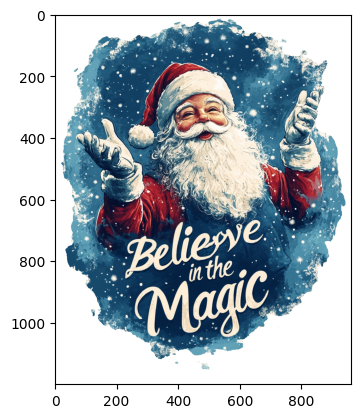

In [ ]:
import cv2
import matplotlib.pyplot as plt
import requests

# load image and select x, y coordinates to test

api_endpoint = 'https://ameyshinde.us-east-1.modelbit.com/v1/remove_background/latest'

image_path = './0_3.png'
if not os.path.exists(image_path):
  !wget https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png

x = 512
y = 690

image = cv2.imread(image_path)

_, image_bytes = cv2.imencode('.png', image)

image_bytes = image_bytes.tobytes()

image_bytes_encoded_base64 = base64.b64encode(image_bytes).decode('utf-8')


# inference_data = modelbit.get_inference(
#   region="us-east-1",
#   workspace="ameyshinde",
#   deployment="remove_background",
#   data=[image_bytes_encoded_base64, x, y]
# )


api_data = {"data": [image_bytes_encoded_base64, x, y]}

response = requests.post(api_endpoint, json=api_data)

# print(response.json())
result_image = response.json()['data']

# result_image = inference_data["data"]

result_image_bytes = base64.b64decode(result_image)

result_image =cv2.imdecode(np.frombuffer(result_image_bytes, dtype=np.uint8), cv2.IMREAD_UNCHANGED)

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGRA2RGBA))
plt.show()

## 2. SAM2 Model

In [ ]:
!pip install torch torchvision opencv-python numpy

In [ ]:
!pip install git+https://github.com/facebookresearch/segment-anything-2.git

  Cloning https://github.com/facebookresearch/segment-anything-2.git to /tmp/pip-req-build-0apdlz9k
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything-2.git /tmp/pip-req-build-0apdlz9k
  Resolved https://github.com/facebookresearch/segment-anything-2.git to commit 7e1596c0b6462eb1d1ba7e1492430fed95023598
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [ ]:
import modelbit

mb1 = modelbit.login()

In [ ]:
# wrap it up as a function

import base64
import os
import torch
import cv2
import numpy as np

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "./sam2_hiera_small.pt"
model_cfg = "sam2_hiera_s.yaml"


if not os.path.exists(sam2_checkpoint):
  !wget https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_small.pt




device = "cuda" if torch.cuda.is_available() else "cpu"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

sam_predictor = SAM2ImagePredictor(sam2_model)

mb1.add_model("sam2_model", sam2_model)
# with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
#     # predictor.set_image(<your_image>)
#     # masks, _, _ = predictor.predict(<input_prompts>)

def remove_background_sam2(image_base64_encoding, x, y):
  image_bytes = base64.b64decode(image_base64_encoding)

  image = cv2.imdecode(np.frombuffer(image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)

  mb = modelbit.login()

  model = mb.get_model("sam2_model")

  sam_predictor = SAM2ImagePredictor(model)
  with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    # predictor.set_image(<your_image>)
    # masks, _, _ = predictor.predict(<input_prompts>)

    sam_predictor.set_image(image)

    masks, scores, logits = sam_predictor.predict(
        point_coords=np.asarray([[x, y]]),
        point_labels=np.asarray([1]),
        multimask_output=False
    )

  C, H, W = masks.shape

  result_mask = np.zeros((H, W), dtype=np.uint8)

  for j in range(C):
    result_mask |= masks[j, :, :].astype(np.uint8)

  result_mask = result_mask.astype(np.uint8)

  alpha_channel = np.ones(result_mask.shape, dtype=result_mask.dtype) * 255
  alpha_channel[result_mask == 0] = 0

  result_image = cv2.merge((image, alpha_channel))

  _, result_image_bytes = cv2.imencode('.png', result_image)

  result_image_bytes = result_image_bytes.tobytes()

  result_image_bytes_encoded_base64 = base64.b64encode(result_image_bytes).decode('utf-8')

  return result_image_bytes_encoded_base64

Encrypting 'sam2_model': 100%|██████████| 184M/184M [00:01<00:00, 103MB/s]
Uploading 'sam2_model': 100%|██████████| 163M/163M [00:05<00:00, 29.6MB/s]
Updating registry: 100%|██████████| 1/1 [00:00<00:00]


In [ ]:
mb1.deploy(remove_background_sam2)

### 2.1 Local

Decrypting 'sam2_model': 100%|██████████| 163M/163M [00:01<00:00, 115MB/s] 


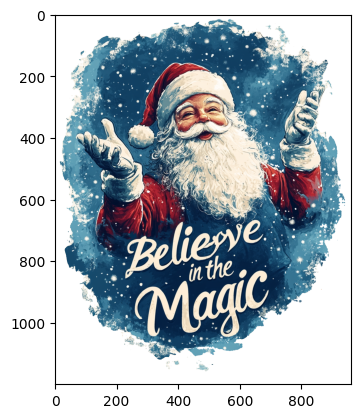

In [ ]:
import cv2
import matplotlib.pyplot as plt

# load image and select x, y coordinates to test


image_path = './0_3.png'
if not os.path.exists(image_path):
  !wget https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png

x = 512
y = 690

image = cv2.imread(image_path)

_, image_bytes = cv2.imencode('.png', image)

image_bytes = image_bytes.tobytes()

image_bytes_encoded_base64 = base64.b64encode(image_bytes).decode('utf-8')

result_image = remove_background_sam2(image_bytes_encoded_base64, x, y)

result_image_bytes = base64.b64decode(result_image)

result_image =cv2.imdecode(np.frombuffer(result_image_bytes, dtype=np.uint8), cv2.IMREAD_UNCHANGED)

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGRA2RGBA))
plt.show()

In [ ]:
filename = 'savedImage.png'

cv2.imwrite(filename, result_image)

True

{'data': 'iVBORw0KGgoAAAANSUhEUgAAA8AAAASwCAYAAAA0UyPUAAAgAElEQVR4AezBXY9tiYEe5OdddU632x47E5MZeyJiJgmgQSIgpCDlIhegKFKu4P/Bj+ASrriLgEsQygcfgkw7yXx0j7ttt93nVNV6s9ZetWvtXXvXrl0f5/Rp28+Tzz//qde4VoO41ToQIo6r1iIR56pDcVoRB4KalARFxCRRpRYpYlHELKhJkaCIW3G/IlZ1hhAHYlEVQdWkiHvFoTotVkXcqANxVxyqu4qgbtQqKGISYhJaW0moW1VbEVtxQtyrdpXaEQ+pRdSsiNhqSyKhRUpLbAS1iKiK56sdtYhHi29GEYsinquOi2eJ0+qZgnpJcY9Y1J66X7w7tS+JXTVpPU19M2JRBLUvqEdrSTxGnCNqVvdKaD1VBHUgqFuJPTWLxB211VYagrhRSk1qElKzCGrWmoTEUaWp1L0qzleLeJpaxF2xKGJRvwlqFeer0+IhMUk8Rq2CekAR1BFxqzZqEeeq52hJUJOqWcQkNlqT2ohFQ1DEjtoVtG7UcRFUbQQNIaKqbsSqiMepI2Ijzld31PtValIbNYmNuEcRSdxq1R21o84Xi1LqUO2LOlSziLZmHUezJsah8uXnn4pBM1Kr1lYt4kbiVuvFhaB2FHErqJjFoo5L4rHqRgiKeLzaFx+qOFAbMasDieOK2KjHS0RUqUUcqkkJERTxVHVHHRG34kZtFLGvVrFoFW0lJLGoA0ERFHFcHVHni/enVrGolxXUSXEjzhHnK2JV96mNmsSeOK6Ie8VLqgNF3IgPRT1GbdR5YlVPF9QizlfEcXUobsVzxFZbxCyoWsQsqLtqFWJRG4mzxY2gFiGJ1o6IWdWkRSSkFFWLqq04JiaJWWtfSqmK0yruV8SiDsVzBEXcr04p9UyxqG+1xFY8VRxTxKpmtaduxL7YUwRFUEfUrjhUzxQ0qFkR56mKu2oVi9oXtxJKrRpSml

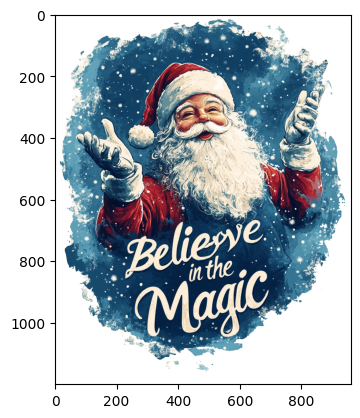

In [ ]:
import cv2
import matplotlib.pyplot as plt
import requests

# load image and select x, y coordinates to test

api_endpoint = "https://ameyshinde.us-east-1.modelbit.com/v1/remove_background_sam2/latest"

image_path = './0_3.png'
if not os.path.exists(image_path):
  !wget https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png

x = 512
y = 690

image = cv2.imread(image_path)

_, image_bytes = cv2.imencode('.png', image)

image_bytes = image_bytes.tobytes()

image_bytes_encoded_base64 = base64.b64encode(image_bytes).decode('utf-8')


# inference_data = modelbit.get_inference(
#   region="us-east-1",
#   workspace="ameyshinde",
#   deployment="remove_background",
#   data=[image_bytes_encoded_base64, x, y]
# )


api_data = {"data": [image_bytes_encoded_base64, x, y]}

response = requests.post(api_endpoint, json=api_data)

print(response.json())
result_image = response.json()['data']

# result_image = inference_data["data"]

result_image_bytes = base64.b64decode(result_image)

result_image =cv2.imdecode(np.frombuffer(result_image_bytes, dtype=np.uint8), cv2.IMREAD_UNCHANGED)

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGRA2RGBA))
plt.show()

In [ ]:
filename = 'savedImagesam.png'

cv2.imwrite(filename, result_image)

True

## 2. SAM2_large Model

In [ ]:
!pip install torch torchvision opencv-python numpy

In [ ]:
!pip install git+https://github.com/facebookresearch/segment-anything-2.git

  Cloning https://github.com/facebookresearch/segment-anything-2.git to /tmp/pip-req-build-0apdlz9k
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything-2.git /tmp/pip-req-build-0apdlz9k
  Resolved https://github.com/facebookresearch/segment-anything-2.git to commit 7e1596c0b6462eb1d1ba7e1492430fed95023598
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [ ]:
import modelbit

mb1 = modelbit.login()

In [ ]:
# wrap it up as a function

import base64
import os
import torch
import cv2
import numpy as np

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "./sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"


if not os.path.exists(sam2_checkpoint):
  !wget https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt




device = "cuda" if torch.cuda.is_available() else "cpu"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

sam_predictor = SAM2ImagePredictor(sam2_model)

mb1.add_model("sam2_model_large", sam2_model)
# with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
#     # predictor.set_image(<your_image>)
#     # masks, _, _ = predictor.predict(<input_prompts>)

def remove_background_sam2_large(image_base64_encoding, x, y):
  image_bytes = base64.b64decode(image_base64_encoding)

  image = cv2.imdecode(np.frombuffer(image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)

  mb = modelbit.login()

  model = mb.get_model("sam2_model_large")

  sam_predictor = SAM2ImagePredictor(model)
  with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    # predictor.set_image(<your_image>)
    # masks, _, _ = predictor.predict(<input_prompts>)

    sam_predictor.set_image(image)

    masks, scores, logits = sam_predictor.predict(
        point_coords=np.asarray([[x, y]]),
        point_labels=np.asarray([1]),
        multimask_output=False
    )

  C, H, W = masks.shape

  result_mask = np.zeros((H, W), dtype=np.uint8)

  for j in range(C):
    result_mask |= masks[j, :, :].astype(np.uint8)

  result_mask = result_mask.astype(np.uint8)

  alpha_channel = np.ones(result_mask.shape, dtype=result_mask.dtype) * 255
  alpha_channel[result_mask == 0] = 0

  result_image = cv2.merge((image, alpha_channel))

  _, result_image_bytes = cv2.imencode('.png', result_image)

  result_image_bytes = result_image_bytes.tobytes()

  result_image_bytes_encoded_base64 = base64.b64encode(result_image_bytes).decode('utf-8')

  return result_image_bytes_encoded_base64

--2024-09-12 23:55:17--  https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.35.7.82, 13.35.7.50, 13.35.7.38, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.35.7.82|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 897952466 (856M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2_hiera_large.pt’

sam2_hiera_large.pt 100%[===================>] 856.35M   112MB/s    in 13s     

2024-09-12 23:55:30 (68.2 MB/s) - ‘sam2_hiera_large.pt’ saved [897952466/897952466]

Encrypting 'sam2_model_large': 100%|██████████| 865M/865M [00:13<00:00, 67.8MB/s]
Uploading 'sam2_model_large': 100%|██████████| 795M/795M [00:18<00:00, 45.1MB/s]
Updating registry: 100%|██████████| 1/1 [00:00<00:00]


In [ ]:
mb1.deploy(remove_background_sam2_large)

### 2.1 Local

Decrypting 'sam2_model': 100%|██████████| 163M/163M [00:01<00:00, 115MB/s] 


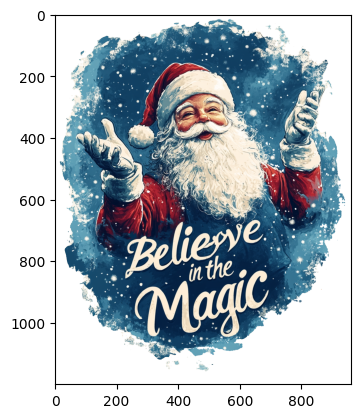

In [ ]:
import cv2
import matplotlib.pyplot as plt

# load image and select x, y coordinates to test


image_path = './0_3.png'
if not os.path.exists(image_path):
  !wget https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png

x = 512
y = 690

image = cv2.imread(image_path)

_, image_bytes = cv2.imencode('.png', image)

image_bytes = image_bytes.tobytes()

image_bytes_encoded_base64 = base64.b64encode(image_bytes).decode('utf-8')

result_image = remove_background_sam2_large(image_bytes_encoded_base64, x, y)

result_image_bytes = base64.b64decode(result_image)

result_image =cv2.imdecode(np.frombuffer(result_image_bytes, dtype=np.uint8), cv2.IMREAD_UNCHANGED)

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGRA2RGBA))
plt.show()

In [ ]:
filename = 'savedImage.png'

cv2.imwrite(filename, result_image)

True

{'data': 'iVBORw0KGgoAAAANSUhEUgAAA8AAAASwCAYAAAA0UyPUAAAgAElEQVR4AezBXY9tiYEe5OdddU632x47E5MZeyJiJgmgQSIgpCDlIhegKFKu4P/Bj+ASrriLgEsQygcfgkw7yXx0j7ttt93nVNV6s9ZetWvtXXvXrl0f5/Rp28+Tzz//qde4VoO41ToQIo6r1iIR56pDcVoRB4KalARFxCRRpRYpYlHELKhJkaCIW3G/IlZ1hhAHYlEVQdWkiHvFoTotVkXcqANxVxyqu4qgbtQqKGISYhJaW0moW1VbEVtxQtyrdpXaEQ+pRdSsiNhqSyKhRUpLbAS1iKiK56sdtYhHi29GEYsinquOi2eJ0+qZgnpJcY9Y1J66X7w7tS+JXTVpPU19M2JRBLUvqEdrSTxGnCNqVvdKaD1VBHUgqFuJPTWLxB211VYagrhRSk1qElKzCGrWmoTEUaWp1L0qzleLeJpaxF2xKGJRvwlqFeer0+IhMUk8Rq2CekAR1BFxqzZqEeeq52hJUJOqWcQkNlqT2ohFQ1DEjtoVtG7UcRFUbQQNIaKqbsSqiMepI2Ijzld31PtValIbNYmNuEcRSdxq1R21o84Xi1LqUO2LOlSziLZmHUezJsah8uXnn4pBM1Kr1lYt4kbiVuvFhaB2FHErqJjFoo5L4rHqRgiKeLzaFx+qOFAbMasDieOK2KjHS0RUqUUcqkkJERTxVHVHHRG34kZtFLGvVrFoFW0lJLGoA0ERFHFcHVHni/enVrGolxXUSXEjzhHnK2JV96mNmsSeOK6Ie8VLqgNF3IgPRT1GbdR5YlVPF9QizlfEcXUobsVzxFZbxCyoWsQsqLtqFWJRG4mzxY2gFiGJ1o6IWdWkRSSkFFWLqq04JiaJWWtfSqmK0yruV8SiDsVzBEXcr04p9UyxqG+1xFY8VRxTxKpmtaduxL7YUwRFUEfUrjhUzxQ0qFkR56mKu2oVi9oXtxJKrRpSml

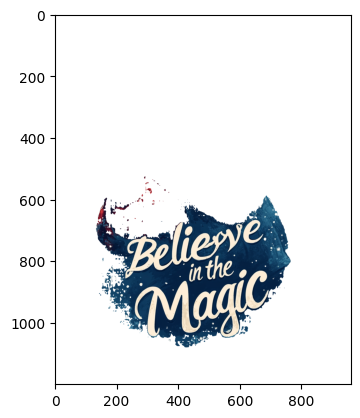

In [ ]:
import cv2
import matplotlib.pyplot as plt
import requests

# load image and select x, y coordinates to test

api_endpoint = "https://ameyshinde.us-east-1.modelbit.com/v1/remove_background_sam2_large/latest"

image_path = './0_3.png'
if not os.path.exists(image_path):
  !wget https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png

x = 512
y = 690

image = cv2.imread(image_path)

_, image_bytes = cv2.imencode('.png', image)

image_bytes = image_bytes.tobytes()

image_bytes_encoded_base64 = base64.b64encode(image_bytes).decode('utf-8')


# inference_data = modelbit.get_inference(
#   region="us-east-1",
#   workspace="ameyshinde",
#   deployment="remove_background",
#   data=[image_bytes_encoded_base64, x, y]
# )


api_data = {"data": [image_bytes_encoded_base64, x, y]}

response = requests.post(api_endpoint, json=api_data)

print(response.json())
result_image = response.json()['data']

# result_image = inference_data["data"]

result_image_bytes = base64.b64decode(result_image)

result_image =cv2.imdecode(np.frombuffer(result_image_bytes, dtype=np.uint8), cv2.IMREAD_UNCHANGED)

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGRA2RGBA))
plt.show()

In [ ]:
filename = 'savedImagesam_large.png'

cv2.imwrite(filename, result_image)

True

## 2. SAM2_tiny Model

In [ ]:
!pip install torch torchvision opencv-python numpy

In [ ]:
!pip install git+https://github.com/facebookresearch/segment-anything-2.git

  Cloning https://github.com/facebookresearch/segment-anything-2.git to /tmp/pip-req-build-0apdlz9k
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything-2.git /tmp/pip-req-build-0apdlz9k
  Resolved https://github.com/facebookresearch/segment-anything-2.git to commit 7e1596c0b6462eb1d1ba7e1492430fed95023598
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [ ]:
import modelbit

mb1 = modelbit.login()

In [ ]:
# wrap it up as a function

import base64
import os
import torch
import cv2
import numpy as np

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "./sam2_hiera_tiny.pt"
model_cfg = "sam2_hiera_t.yaml"


if not os.path.exists(sam2_checkpoint):
  !wget https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt




device = "cuda" if torch.cuda.is_available() else "cpu"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

sam_predictor = SAM2ImagePredictor(sam2_model)

mb1.add_model("sam2_model_tiny", sam2_model)
# with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
#     # predictor.set_image(<your_image>)
#     # masks, _, _ = predictor.predict(<input_prompts>)

def remove_background_sam2_tiny(image_base64_encoding, x, y):
  image_bytes = base64.b64decode(image_base64_encoding)

  image = cv2.imdecode(np.frombuffer(image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)

  mb = modelbit.login()

  model = mb.get_model("sam2_model_tiny")

  sam_predictor = SAM2ImagePredictor(model)
  with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    # predictor.set_image(<your_image>)
    # masks, _, _ = predictor.predict(<input_prompts>)

    sam_predictor.set_image(image)

    masks, scores, logits = sam_predictor.predict(
        point_coords=np.asarray([[x, y]]),
        point_labels=np.asarray([1]),
        multimask_output=False
    )

  C, H, W = masks.shape

  result_mask = np.zeros((H, W), dtype=np.uint8)

  for j in range(C):
    result_mask |= masks[j, :, :].astype(np.uint8)

  result_mask = result_mask.astype(np.uint8)

  alpha_channel = np.ones(result_mask.shape, dtype=result_mask.dtype) * 255
  alpha_channel[result_mask == 0] = 0

  result_image = cv2.merge((image, alpha_channel))

  _, result_image_bytes = cv2.imencode('.png', result_image)

  result_image_bytes = result_image_bytes.tobytes()

  result_image_bytes_encoded_base64 = base64.b64encode(result_image_bytes).decode('utf-8')

  return result_image_bytes_encoded_base64

--2024-09-13 00:02:16--  https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.35.7.38, 13.35.7.82, 13.35.7.50, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.35.7.38|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 155906050 (149M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2_hiera_tiny.pt’

sam2_hiera_tiny.pt  100%[===================>] 148.68M   124MB/s    in 1.2s    

2024-09-13 00:02:18 (124 MB/s) - ‘sam2_hiera_tiny.pt’ saved [155906050/155906050]

Encrypting 'sam2_model_tiny': 100%|██████████| 157M/157M [00:01<00:00, 83.9MB/s]
Uploading 'sam2_model_tiny': 100%|██████████| 138M/138M [00:06<00:00, 22.3MB/s]
Updating registry: 100%|██████████| 1/1 [00:00<00:00]


In [ ]:
mb1.deploy(remove_background_sam2_tiny)

### 2.1 Local

Decrypting 'sam2_model': 100%|██████████| 163M/163M [00:01<00:00, 115MB/s] 


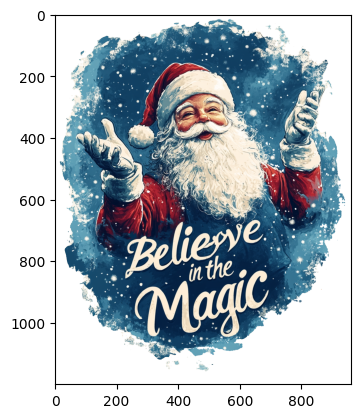

In [ ]:
import cv2
import matplotlib.pyplot as plt

# load image and select x, y coordinates to test


image_path = './0_3.png'
if not os.path.exists(image_path):
  !wget https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png

x = 512
y = 690

image = cv2.imread(image_path)

_, image_bytes = cv2.imencode('.png', image)

image_bytes = image_bytes.tobytes()

image_bytes_encoded_base64 = base64.b64encode(image_bytes).decode('utf-8')

result_image = remove_background_sam2_large(image_bytes_encoded_base64, x, y)

result_image_bytes = base64.b64decode(result_image)

result_image =cv2.imdecode(np.frombuffer(result_image_bytes, dtype=np.uint8), cv2.IMREAD_UNCHANGED)

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGRA2RGBA))
plt.show()

In [ ]:
filename = 'savedImage.png'

cv2.imwrite(filename, result_image)

True

{'data': 'iVBORw0KGgoAAAANSUhEUgAAA8AAAASwCAYAAAA0UyPUAAAgAElEQVR4AezBXY9tiYEe5OdddU632x47E5MZeyJiJgmgQSIgpCDlIhegKFKu4P/Bj+ASrriLgEsQygcfgkw7yXx0j7ttt93nVNV6s9ZetWvtXXvXrl0f5/Rp28+Tzz//qde4VoO41ToQIo6r1iIR56pDcVoRB4KalARFxCRRpRYpYlHELKhJkaCIW3G/IlZ1hhAHYlEVQdWkiHvFoTotVkXcqANxVxyqu4qgbtQqKGISYhJaW0moW1VbEVtxQtyrdpXaEQ+pRdSsiNhqSyKhRUpLbAS1iKiK56sdtYhHi29GEYsinquOi2eJ0+qZgnpJcY9Y1J66X7w7tS+JXTVpPU19M2JRBLUvqEdrSTxGnCNqVvdKaD1VBHUgqFuJPTWLxB211VYagrhRSk1qElKzCGrWmoTEUaWp1L0qzleLeJpaxF2xKGJRvwlqFeer0+IhMUk8Rq2CekAR1BFxqzZqEeeq52hJUJOqWcQkNlqT2ohFQ1DEjtoVtG7UcRFUbQQNIaKqbsSqiMepI2Ijzld31PtValIbNYmNuEcRSdxq1R21o84Xi1LqUO2LOlSziLZmHUezJsah8uXnn4pBM1Kr1lYt4kbiVuvFhaB2FHErqJjFoo5L4rHqRgiKeLzaFx+qOFAbMasDieOK2KjHS0RUqUUcqkkJERTxVHVHHRG34kZtFLGvVrFoFW0lJLGoA0ERFHFcHVHni/enVrGolxXUSXEjzhHnK2JV96mNmsSeOK6Ie8VLqgNF3IgPRT1GbdR5YlVPF9QizlfEcXUobsVzxFZbxCyoWsQsqLtqFWJRG4mzxY2gFiGJ1o6IWdWkRSSkFFWLqq04JiaJWWtfSqmK0yruV8SiDsVzBEXcr04p9UyxqG+1xFY8VRxTxKpmtaduxL7YUwRFUEfUrjhUzxQ0qFkR56mKu2oVi9oXtxJKrRpSml

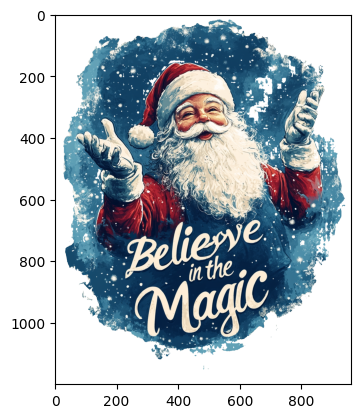

In [ ]:
import cv2
import matplotlib.pyplot as plt
import requests

# load image and select x, y coordinates to test

api_endpoint = "https://ameyshinde.us-east-1.modelbit.com/v1/remove_background_sam2_tiny/latest"

image_path = './0_3.png'
if not os.path.exists(image_path):
  !wget https://cdn.midjourney.com/9a9bccf8-ac52-486a-9e63-e2e4b92fc28a/0_3.png

x = 512
y = 690

image = cv2.imread(image_path)

_, image_bytes = cv2.imencode('.png', image)

image_bytes = image_bytes.tobytes()

image_bytes_encoded_base64 = base64.b64encode(image_bytes).decode('utf-8')


# inference_data = modelbit.get_inference(
#   region="us-east-1",
#   workspace="ameyshinde",
#   deployment="remove_background",
#   data=[image_bytes_encoded_base64, x, y]
# )


api_data = {"data": [image_bytes_encoded_base64, x, y]}

response = requests.post(api_endpoint, json=api_data)

print(response.json())
result_image = response.json()['data']

# result_image = inference_data["data"]

result_image_bytes = base64.b64decode(result_image)

result_image =cv2.imdecode(np.frombuffer(result_image_bytes, dtype=np.uint8), cv2.IMREAD_UNCHANGED)

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGRA2RGBA))
plt.show()

In [ ]:
filename = 'savedImagesam_tiny.png'

cv2.imwrite(filename, result_image)

True